In [1]:
import json
from pathlib import Path
from evaluate import *
import random
import subprocess
import matplotlib.pyplot as plt
import numpy as np
import cv2
import decord
import matplotlib.image as mpimg

gt_annotations = json.loads(Path('/data/datasets/ego4d_data/v2/annotations/vq_val.json').read_text())
model_predictions = json.loads(Path('/data/soyeonhong/vq2d/VQLoC/output/ego4d_vq2d/val/validate/inference_cache_val_results.json.gz').read_text())

validate_model_predictions(model_predictions, gt_annotations)

Validating user predictions: 4527it [00:00, 672866.30it/s]           


In [2]:
all_result = {}
clip_list = []

for vanno, vpred in zip(
    gt_annotations["videos"], model_predictions["results"]["videos"]
):
    for clip_annos, clip_preds in zip(vanno["clips"], vpred["clips"]):
        for clip_anno, clip_pred in zip(clip_annos["annotations"], clip_preds["predictions"]):
            predicted_response_tracks = []
            annotated_response_tracks = []
            visual_crop_boxes = []
            qset_ids = list(clip_anno["query_sets"].keys())
            for qset_id in qset_ids:
                if not clip_anno["query_sets"][qset_id]["is_valid"]:
                    continue
                q_anno = clip_anno["query_sets"][qset_id]
                q_pred = clip_pred["query_sets"][qset_id]['bboxes']
                # rt_pred = ResponseTrack.from_json(q_pred)
                rt_anno = []
                for rf in q_anno["response_track"]:
                    rt_anno.append(
                        { "frame_number": rf["frame_number"], 
                         "x1": rf["x"], 
                         "y1": rf["y"], 
                         "x2": rf["x"] + rf["width"],
                         "y2": rf["y"] + rf["height"],
                         "original_width": rf["original_width"],
                         "original_height": rf["original_height"],
                         }
                    )
                # rt_anno = ResponseTrack(rt_anno)
                vc = q_anno["visual_crop"]
                vc_bbox = { "frame_number": vc["frame_number"], 
                         "x1": vc["x"], 
                         "y1": vc["y"], 
                         "x2": vc["x"] + vc["width"],
                         "y2": vc["y"] + vc["height"],
                         "original_width": rf["original_width"],
                         "original_height": rf["original_height"]
                         }
                

                predicted_response_tracks.append(q_pred)
                # predicted_response_tracks.append([rt_pred])
                annotated_response_tracks.append(rt_anno)
                visual_crop_boxes.append(vc_bbox)
                
        clip_list.append(clip_annos['clip_uid'])
        all_result[clip_annos['clip_uid']] = {
            "predicted_response_tracks": predicted_response_tracks,
            "annotated_response_tracks": annotated_response_tracks,
            "visual_crop_boxes": visual_crop_boxes,
        }

In [3]:
def extract_frame(video_file, frame_number):
    # Use decord to load the video file
    decord.bridge.set_bridge('torch')
    vr = decord.VideoReader(video_file)
    
    # Extract specific frame
    frame_tensor = vr[frame_number]
    
    # Get video width and height from the frame shape
    height, width, _ = frame_tensor.shape
    
    # Convert tensor to numpy array and ensure correct data type
    frame = frame_tensor.contiguous().cpu().numpy().astype(np.uint8)
    
    # Convert to RGB format
    frame = frame[:, :, ::-1]
    
    # Ensure the array is contiguous
    frame = np.ascontiguousarray(frame)
    
    return frame, width, height

def plot_frames(all_gt_frames, main_title, clip_uid, frame_number, num_cols=4, figsize=(30, 20)):

    # Define number of subplots
    num_frames = len(all_gt_frames)
    num_rows = (num_frames // num_cols) + (1 if num_frames % num_cols != 0 else 0)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    # Plot each frame in a subplot
    for idx, frame in enumerate(all_gt_frames):
        axes[idx].imshow(frame)
        axes[idx].axis('off')  # Hide the axis
        axes[idx].set_title(f"Frame {frame_number[idx] + 1}")

    # Remove any unused subplots
    for idx in range(len(all_gt_frames), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(f"{main_title}\n{clip_uid}", fontsize=13, y=1.05)
    plt.tight_layout()
    plt.show()

def process_frame(clip, frame_number, bbox, color, original_width):
    frame, width, height = extract_frame('/data/datasets/ego4d_data/v2/vq2d_clips/{}.mp4'.format(clip), frame_number)
    ratio = width / original_width
    
    x1 = int(bbox['x1'] * ratio)
    x2 = int(bbox['x2'] * ratio)
    y1 = int(bbox['y1'] * ratio)
    y2 = int(bbox['y2'] * ratio)

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
    return frame

5333a996-877f-4e30-ba79-631131744a4b


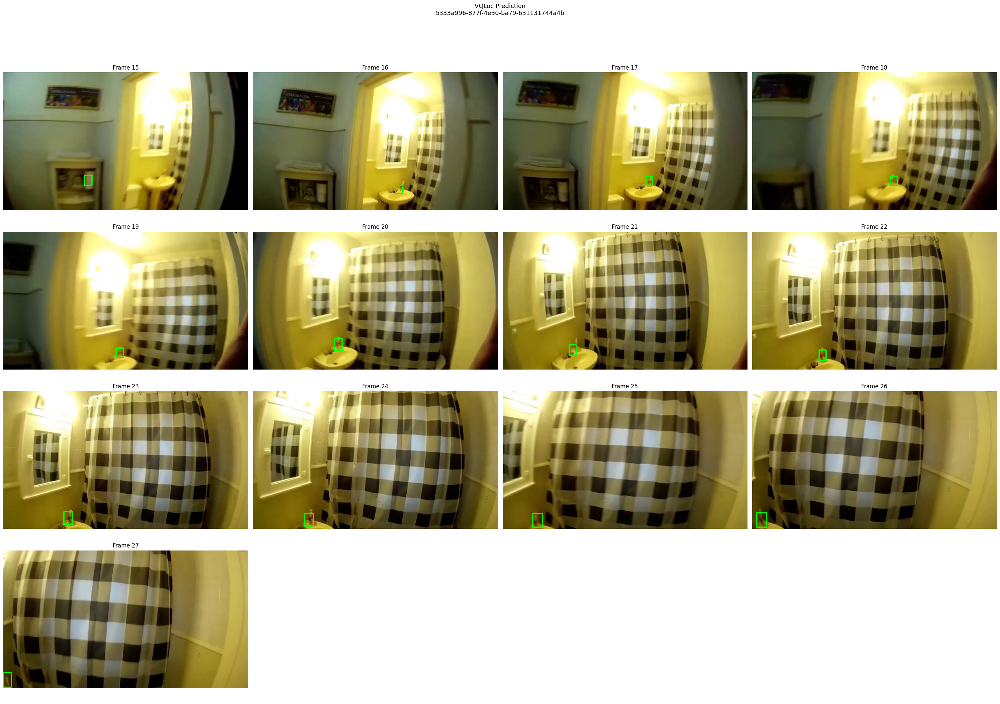

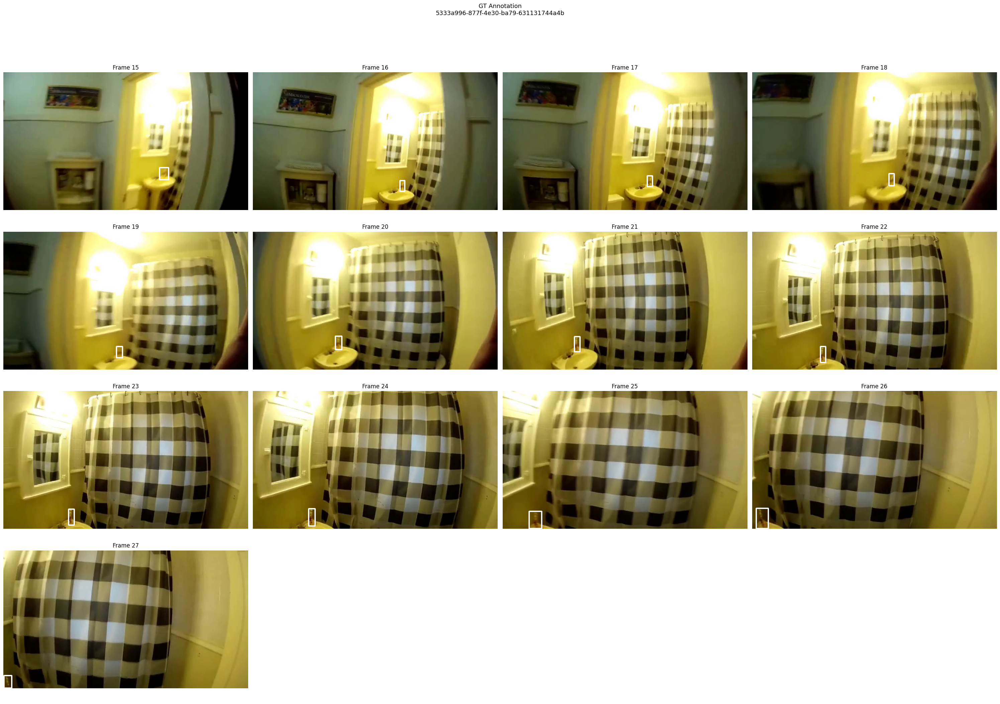

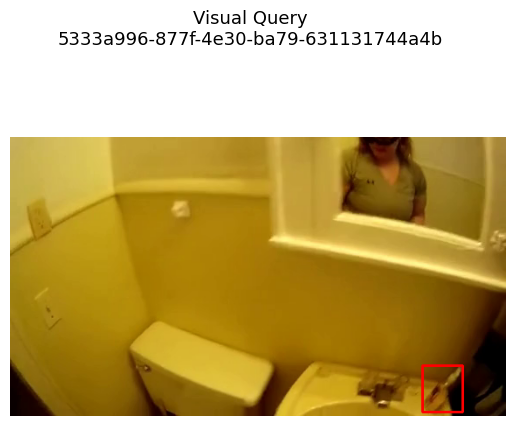

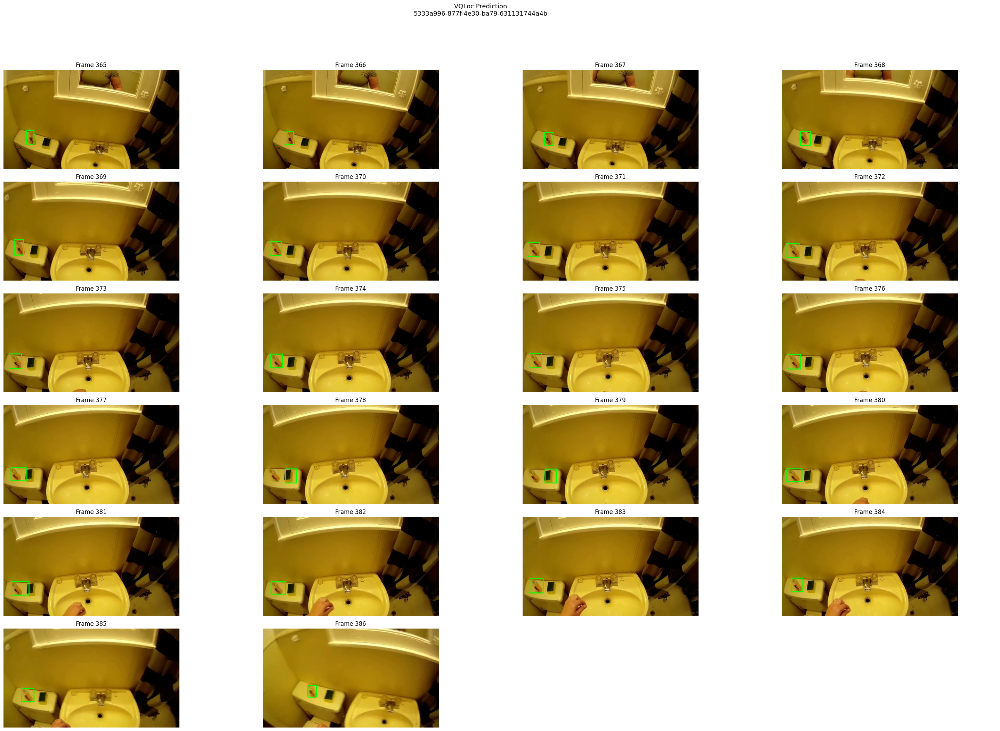

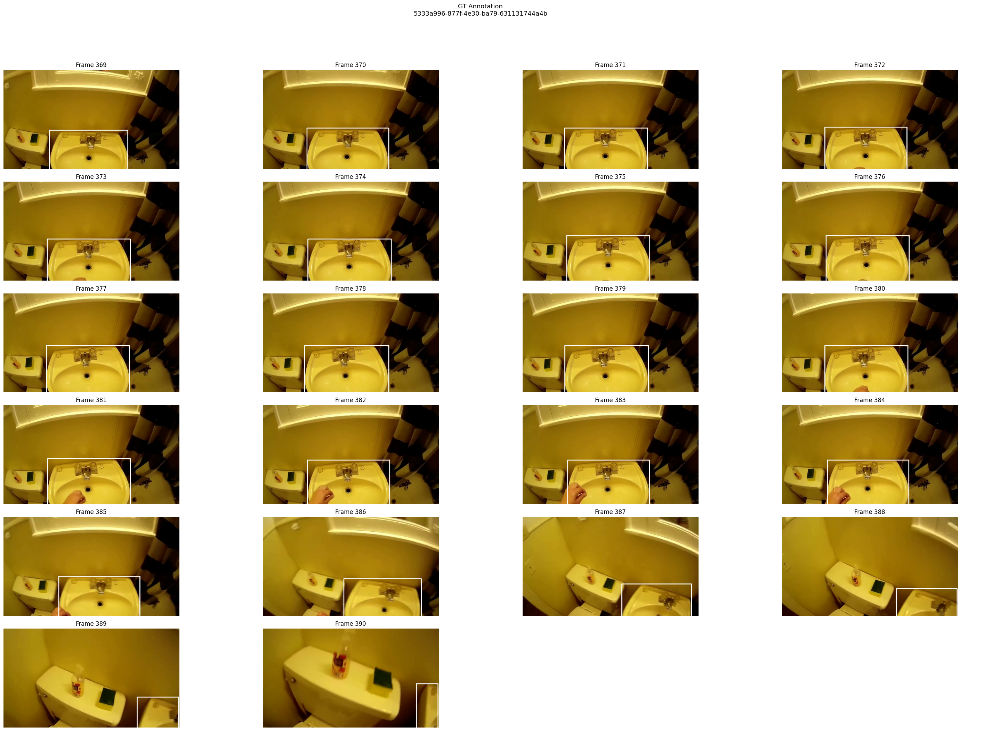

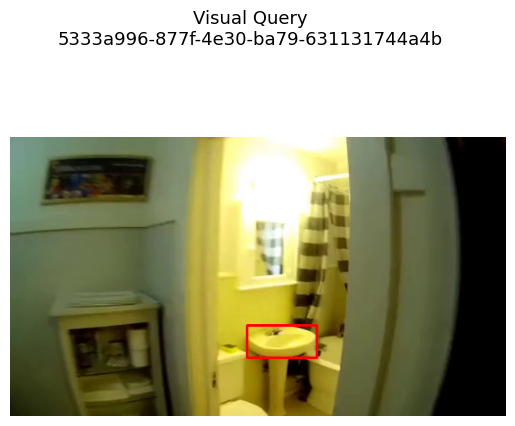

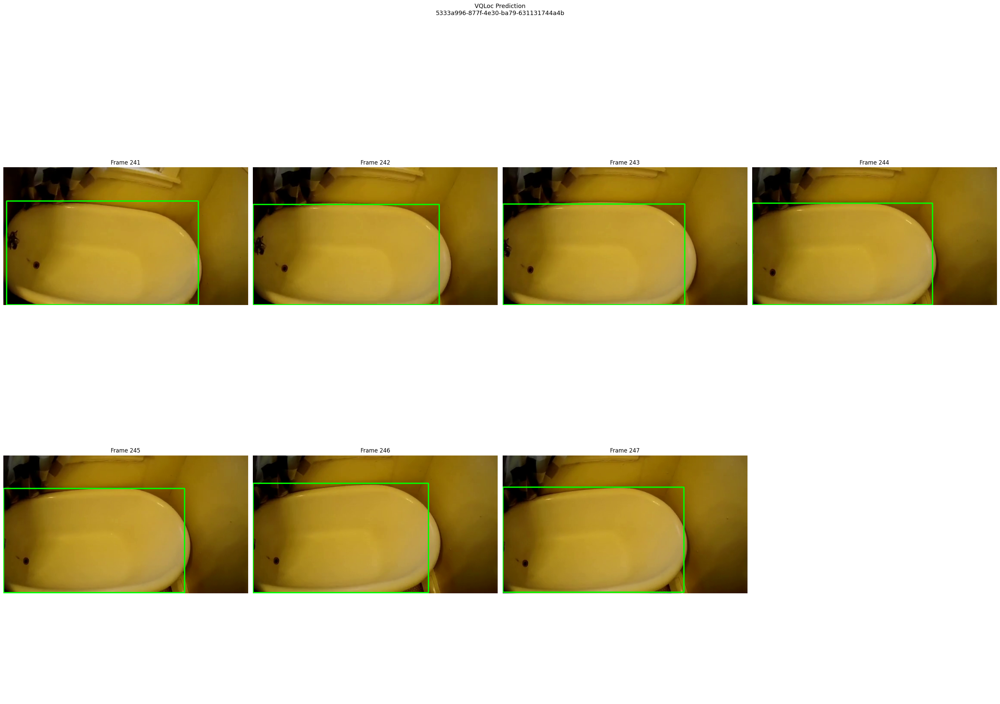

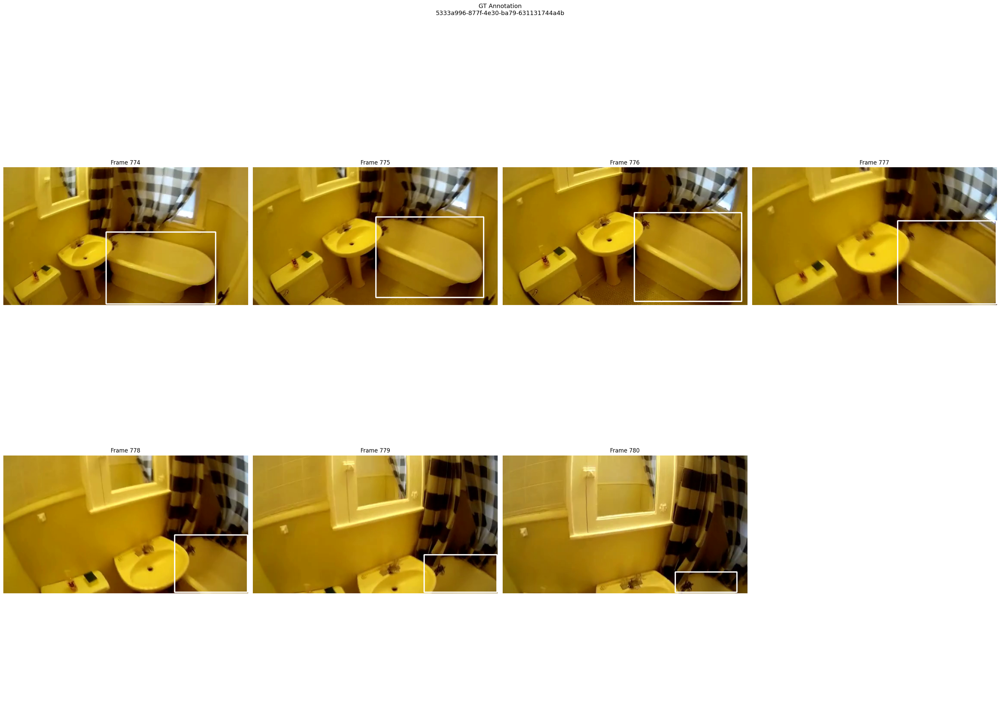

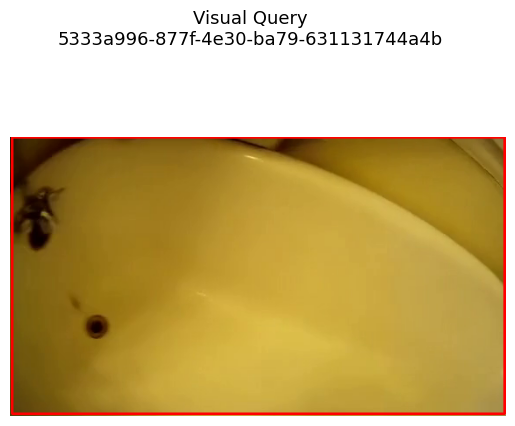

In [8]:
random_int = random.randint(0, len(clip_list))
clip_uid = clip_list[random_int]
# clip_uid = '8ebdf93c-6bba-4604-be9b-45938eb2bb38'
# clip_uid = 'ead0de42-5a1a-4e50-968c-0d66397ea67b'
# clip_uid = '7dc19991-8636-413a-905e-063bd3a34d70'
clip_uid = '5333a996-877f-4e30-ba79-631131744a4b'
result_list = all_result[clip_uid]

print(clip_uid)
for idx, (preds, annos) in enumerate(zip(result_list['predicted_response_tracks'], result_list['annotated_response_tracks'])):
    all_pred_frames = []
    all_pred_frame_numbers = []
    all_gt_frames = []
    all_gt_frame_numbers = []
    
    for pred, anno in zip(preds, annos):
        all_pred_frames.append(process_frame(clip_uid, pred['fno'], pred, (0, 255, 0), anno['original_width']))
        all_pred_frame_numbers.append(pred['fno'])
        
    plot_frames(all_pred_frames, "VQLoc Prediction", clip_uid, all_pred_frame_numbers)
        
    for anno in annos:
        all_gt_frames.append(process_frame(clip_uid, anno['frame_number'], anno, (255, 255, 255), anno['original_width']))
        all_gt_frame_numbers.append(anno['frame_number'])

    plot_frames(all_gt_frames, "GT Annotation", clip_uid, all_gt_frame_numbers)
    
    visual_query = process_frame(clip_uid, result_list['visual_crop_boxes'][idx]['frame_number'], result_list['visual_crop_boxes'][idx], (255, 0, 0), anno['original_width'])
    
    # Display the frame
    plt.imshow(visual_query)
    plt.axis('off')
    plt.suptitle(f"Visual Query\n{clip_uid}", fontsize=13, y=1.05)

In [6]:
pred

{'fno': 241, 'x1': 644, 'x2': 783, 'y1': 1010, 'y2': 1080}